<a href="https://colab.research.google.com/github/kazars24/ds-school-final-project/blob/main/Final_Project_v2_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <center>**Финальный проект** </center>

## Постановка задачи

Предсказать, является ли рак доброкачественным или злокачественным.
Целевая переменная *diagnosis* имеет два значения: B и M (доброкачественная и злокачественная соответственно).

## Описание данных

- `id` -- идентификационный номер каждого наблюдения.
- `diagnosis` -- целевая переменная.
- `radius` -- среднее расстояние от центра до точек по периметру.
- `texture` -- стандартное отклонение значений серой шкалы.
- `perimeter` -- периметр клетки.
- `area` -- площадь клетки.
- `smoothness` -- локальное изменение длин радиусов.
- `compactness` -- периметр^2 / площадь - 1.0.
- `concavity` -- выраженность вогнутых участков контура.
- `concave points` -- количество вогнутых участков контура.
- `symmetry` -- симметрия.
- `fractal_dimension` -- "приближение береговой линии" - 1.

Среднее значение, стандартная ошибка и "наихудшее" или наибольшее (среднее из трех
наибольших значений) этих признаков были вычислены для каждого изображения, в
результате чего было получено 30 признаков. Например, поле 3-это средний радиус, поле
13-Радиус SE, поле 23-Наихудший радиус.

##  Первичный анализ данных

In [1]:
from __future__ import division, print_function
# отключим всякие предупреждения Anaconda
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
df = pd.read_csv("data.csv")
print(df.shape)
df.head()

(569, 33)


,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [4]:
df.isnull().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

In [5]:
df.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,0.405172,1.216853,2.866059,40.337079,0.007041,0.025478,0.031894,0.011796,0.020542,0.003795,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,0.277313,0.551648,2.021855,45.491006,0.003003,0.017908,0.030186,0.006170,0.008266,0.002646,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,0.111500,0.360200,0.757000,6.802000,0.001713,0.002252,0.000000,0.000000,0.007882,0.000895,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,0.232400,0.833900,1.606000,17.850000,0.005169,0.013080,0.015090,0.007638,0.015160,0.002248,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,0.324200,1.108000,2.287000,24.530000,0.006380,0.020450,0.025890,0.010930,0.018730,0.003187,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,0.478900,1.474000,3.357000,45.190000,0.008146,0.032450,0.042050,0.014710,0.023480,0.004558,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,4.885000,21.980000,542.200000,0.031130,0.135400,0.396000,0.052790,0.078950,0.029840,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


Так как `id` не пригодится в построении модели, то этот признак можно удалить.

Признак `Unnamed: 32` не несет абсолютно никакой информации, а всего его значения это NaN, то этот признак тоже можно удалить.

In [6]:
df = df.drop(['Unnamed: 32','id'], axis = 1)
df.shape

(569, 31)

## Первичный визуальный анализ признаков

In [7]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
#графики в svg выглядят более четкими
%config InlineBackend.figure_format = 'svg' 

sns.set(context='notebook', style='darkgrid', palette='deep',
        font='sans-serif', font_scale=1, color_codes=False, rc=None)

In [8]:
cols = ['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
        'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
        'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']

sns.pairplot(df[cols], hue="diagnosis", palette='inferno')
plt.savefig('pairplot_mean1.png')

In [9]:
cols = ['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
        'area_mean', 'smoothness_mean']

sns.pairplot(df[cols], hue="diagnosis", palette='inferno')
plt.savefig('pairplot_mean2.png')

In [10]:
cols = ['diagnosis', 'radius_se', 'texture_se', 'perimeter_se',
        'area_se', 'smoothness_se']
sns.pairplot(df[cols], hue="diagnosis", palette='inferno')
plt.savefig('pairplot_se.png')

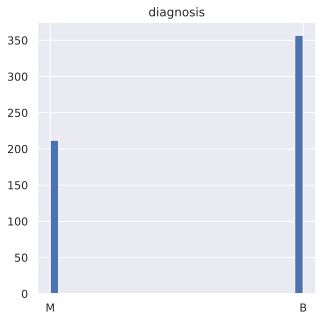

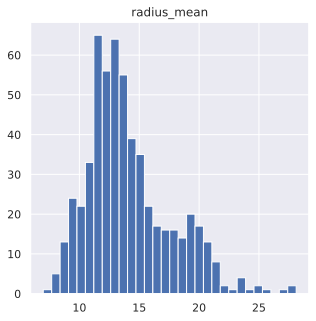

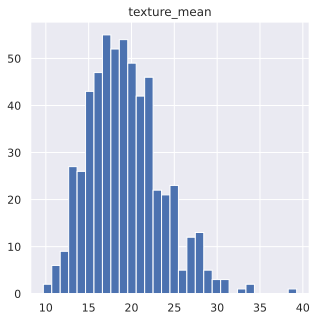

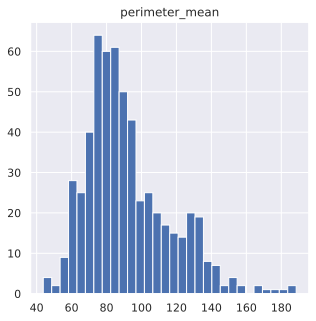

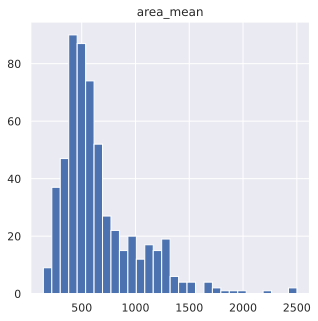

...

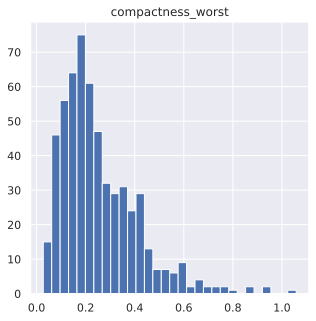

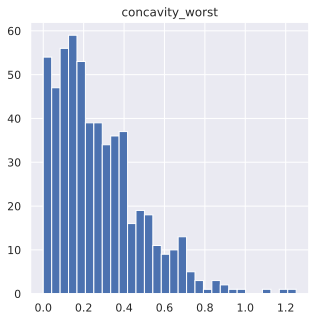

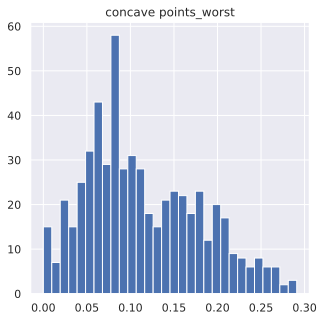

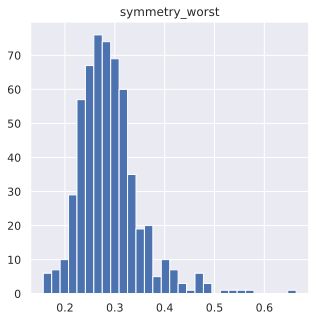

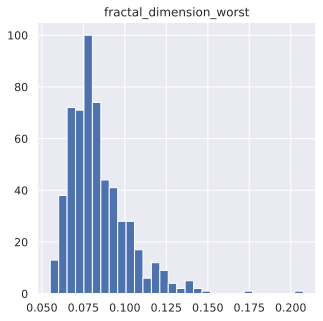

In [11]:
j = 0
for i in df.columns:
  j = j+1
  plt.figure(figsize = (5,5))
  plt.title(i)
  plt.hist(df[i],30)

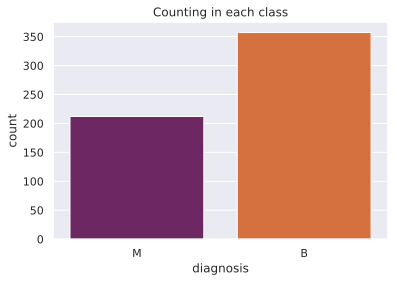

In [12]:
sns.countplot(x='diagnosis', data=df, palette='inferno')
plt.title('Counting in each class')
plt.savefig('countplot.png')

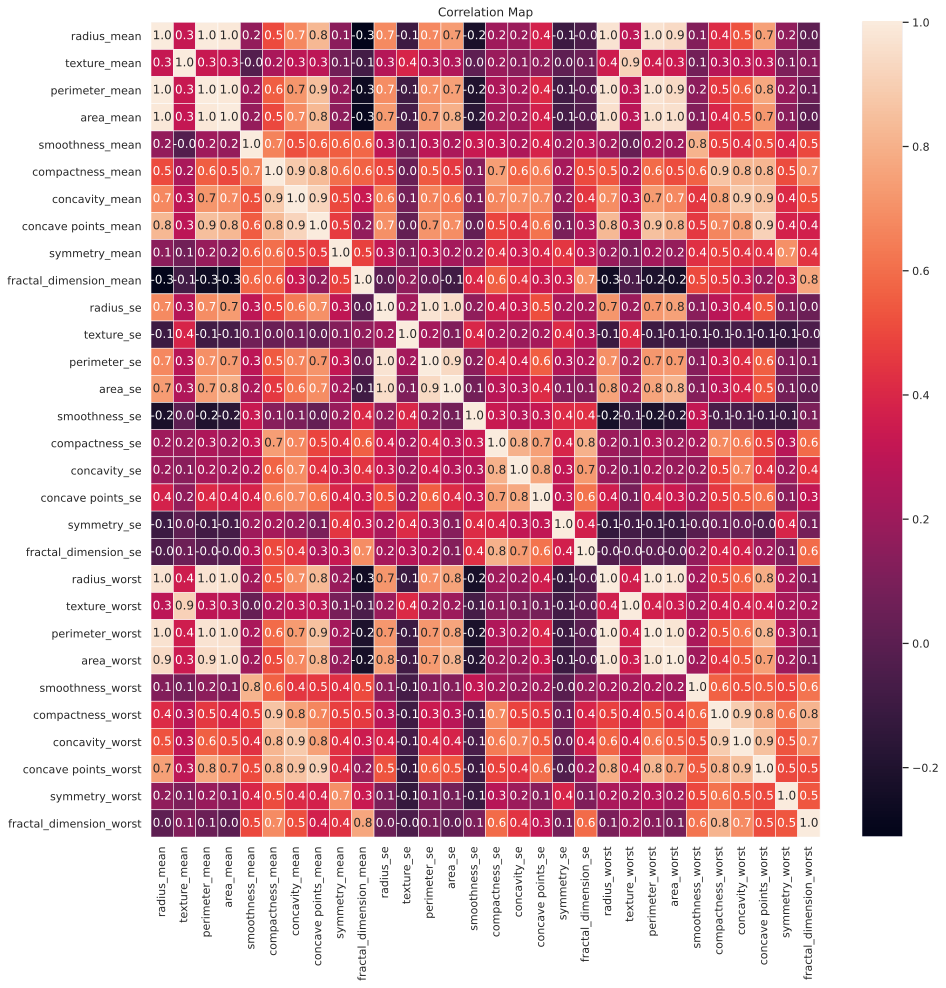

<Figure size 432x288 with 0 Axes>

In [13]:
f, ax=plt.subplots(figsize = (15,15))
sns.heatmap(df.corr(), annot=True, linewidths=0.5, fmt=".1f", ax=ax)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.title('Correlation Map')
plt.show()
plt.savefig('heatmap.png')

По графикам можно заметить, что такие фичи, как радиус, периметр и площадь (особенно средние значения) связаны между собой и находятся в прямой зависимости друг от друга, соответственно они сильно скоррелированные (1.0).

Кроме того, среднее значение, стандартная ошибка и "наихудшее" у некоторых признаков тоже сильно скорррелированные.

Наблюдений класса B больше чем M, но значения класса B у многих фичей выше, чем у класса M.

In [14]:
from sklearn.model_selection import train_test_split

df, holdout = train_test_split(df, test_size = 0.2, random_state = 17)

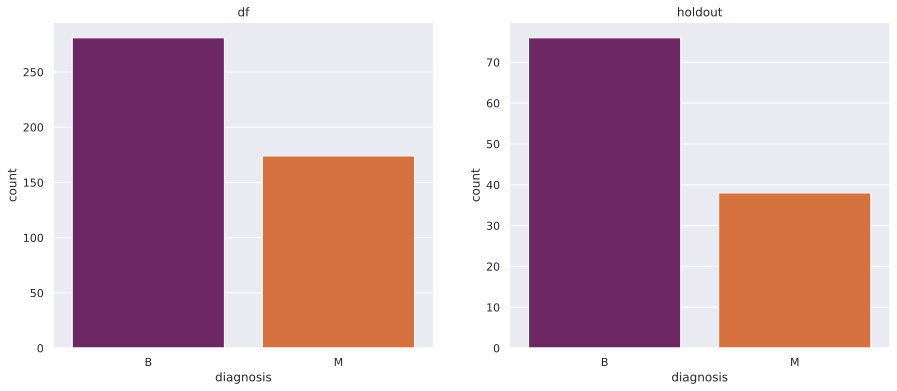

<Figure size 432x288 with 0 Axes>

In [15]:
# проверка на сбалансированность обучающей и тестовой выборок
plt.figure(figsize=(15, 6))

plt.subplot(121)
sns.countplot(x=df['diagnosis'], data=df, palette='inferno')
plt.title('df')

plt.subplot(122)
sns.countplot(x=holdout['diagnosis'], data=holdout, palette='inferno')
plt.title('holdout')

plt.show()
plt.savefig('balance.png')

In [16]:
y = df['diagnosis']
X = df.drop('diagnosis', axis = 1)
y_holdout = holdout['diagnosis']
X_holdout = holdout.drop('diagnosis', axis = 1)

In [17]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3,
                                                    stratify = y,
                                                    random_state = 17)

In [18]:
def correlation(data, limit):
    col_corr = set() # набор имен столбцов
    corr_matrix = data.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i, j]) > limit: 
                col_name = corr_matrix.columns[i] # получение имени столбца
                col_corr.add(col_name)
    return col_corr

In [19]:
corr_features = correlation(X_train, 0.9)
print(len(corr_features))
print(corr_features)
# удаляем сильно скоррелированные фичи
X_train = X_train.drop(corr_features, axis=1) 
X_train.head()

11
{'area_mean', 'area_worst', 'concave points_worst', 'perimeter_worst', 'concave points_mean', 'perimeter_se', 'perimeter_mean', 'radius_worst', 'texture_worst', 'area_se', 'concavity_worst'}


,radius_mean,texture_mean,smoothness_mean,compactness_mean,concavity_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,smoothness_worst,compactness_worst,symmetry_worst,fractal_dimension_worst
431,12.400,17.68,0.10540,0.13160,0.07741,0.1811,0.07102,0.1767,1.4600,0.010000,0.03295,0.04861,0.011670,0.02187,0.006005,0.1450,0.2629,0.2556,0.09359
219,19.530,32.47,0.08420,0.11300,0.11450,0.1428,0.05313,0.7392,1.3210,0.005539,0.02644,0.02664,0.010780,0.01332,0.002256,0.1408,0.4097,0.2713,0.07568
268,12.870,16.21,0.09425,0.06219,0.03900,0.2010,0.05769,0.2345,1.2190,0.005518,0.02178,0.02589,0.006330,0.02593,0.002157,0.1256,0.1808,0.3604,0.07062
40,13.440,21.58,0.08162,0.06031,0.03110,0.1784,0.05587,0.2385,0.8265,0.003280,0.01102,0.01390,0.006881,0.01380,0.001286,0.1094,0.2043,0.2994,0.07146
176,9.904,18.06,0.09699,0.12940,0.13070,0.1669,0.08116,0.4311,2.2610,0.012860,0.08808,0.11970,0.024600,0.03880,0.017920,0.1301,0.2950,0.2614,0.11620


In [20]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 318 entries, 431 to 103
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   radius_mean              318 non-null    float64
 1   texture_mean             318 non-null    float64
 2   smoothness_mean          318 non-null    float64
 3   compactness_mean         318 non-null    float64
 4   concavity_mean           318 non-null    float64
 5   symmetry_mean            318 non-null    float64
 6   fractal_dimension_mean   318 non-null    float64
 7   radius_se                318 non-null    float64
 8   texture_se               318 non-null    float64
 9   smoothness_se            318 non-null    float64
 10  compactness_se           318 non-null    float64
 11  concavity_se             318 non-null    float64
 12  concave points_se        318 non-null    float64
 13  symmetry_se              318 non-null    float64
 14  fractal_dimension_se    

In [21]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [22]:
X_train_columns = X_train.columns
X_train=scaler.fit_transform(X_train)
X_train

array([[-0.48618945, -0.39660893,  0.65334639, ...,  0.10141047,
        -0.56498474,  0.56522763],
       [ 1.57830763,  2.96115579, -0.88557742, ...,  1.0601968 ,
        -0.30981781, -0.45925352],
       [-0.35010059, -0.73034213, -0.15604043, ..., -0.4348045 ,
         1.13829514, -0.74869376],
       ...,
       [-2.05526515, -1.36148385,  1.49539904, ..., -0.83059776,
         0.04611568,  0.578384  ],
       [-1.01606739, -0.25131011, -1.0873797 , ..., -1.1883792 ,
        -0.33257155, -0.93517106],
       [-1.21701563, -0.00611837,  0.29765173, ..., -0.11216114,
        -0.45771711,  0.06814549]])

In [23]:
X_train = pd.DataFrame(X_train, columns=X_train_columns)
X_train.head()

,radius_mean,texture_mean,smoothness_mean,compactness_mean,concavity_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,smoothness_worst,compactness_worst,symmetry_worst,fractal_dimension_worst
0,-0.486189,-0.396609,0.653346,0.602574,-0.101106,-0.000711,1.184021,-0.819157,0.540722,1.068394,0.580171,0.643098,0.074284,0.204936,0.950881,0.478983,0.101410,-0.564985,0.565228
1,1.578308,2.961156,-0.885577,0.230803,0.380122,-1.419960,-1.352675,1.245739,0.266909,-0.510482,0.170892,-0.107700,-0.078550,-0.847775,-0.545835,0.304042,1.060197,-0.309818,-0.459254
2,-0.350101,-0.730342,-0.156040,-0.784771,-0.599460,0.736706,-0.706094,-0.606977,0.065982,-0.517915,-0.122078,-0.133330,-0.842725,0.704820,-0.585359,-0.329078,-0.434804,1.138295,-0.748694
3,-0.185057,0.488806,-1.072862,-0.822348,-0.701959,-0.100762,-0.964160,-0.592294,-0.707195,-1.310007,-0.798551,-0.543073,-0.748104,-0.788676,-0.933089,-1.003850,-0.281320,0.146882,-0.700644
4,-1.208908,-0.310338,0.042858,0.558601,0.590310,-0.526908,2.621813,0.114727,2.118592,2.080631,4.046154,3.072510,2.294683,2.289428,5.707717,-0.141641,0.311063,-0.470719,1.858556


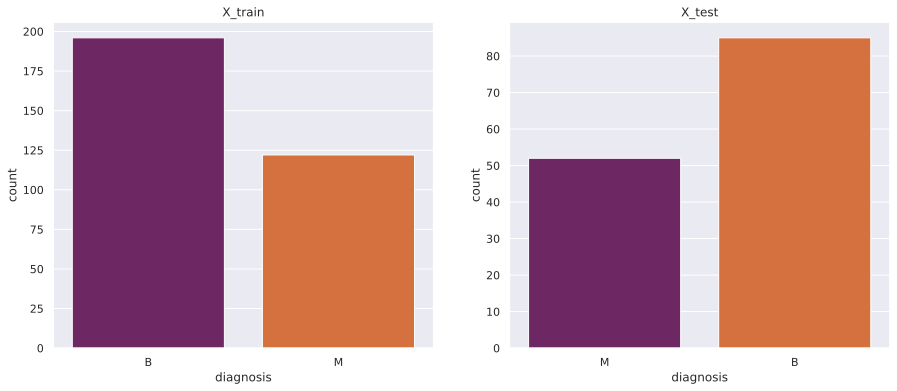

<Figure size 432x288 with 0 Axes>

In [24]:
# проверка на сбалансированность обучающей и тестовой выборок
plt.figure(figsize=(15, 6))

plt.subplot(121)
sns.countplot(x=y_train, data=X_train, palette='inferno')
plt.title('X_train')

plt.subplot(122)
sns.countplot(x=y_test, data=X_test, palette='inferno')
plt.title('X_test')

plt.show()
plt.savefig('balance.png')

In [25]:
from sklearn.pipeline import make_pipeline, make_union
from sklearn.preprocessing import FunctionTransformer

def drop_func(data):
  return data.drop(corr_features, axis=1)

vec = make_union(*[
    make_pipeline(FunctionTransformer(drop_func, validate=False),
                  scaler)])

In [26]:
X_test = vec.transform(X_test)
X_test = pd.DataFrame(X_test, columns=X_train_columns)

In [27]:
X_test.head()

,radius_mean,texture_mean,smoothness_mean,compactness_mean,concavity_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,smoothness_worst,compactness_worst,symmetry_worst,fractal_dimension_worst
0,1.552248,-0.137795,0.907414,0.866412,1.821598,0.043757,-0.215487,0.609568,0.438288,-0.599318,0.289715,0.436346,0.089740,-0.373747,-0.164570,0.745559,0.817235,0.588955,0.365022
1,0.978938,4.507226,0.124886,0.566596,0.733030,-0.008122,-0.426760,0.502010,-0.648886,-0.750800,0.259538,-0.128887,0.429754,-0.978287,-0.345022,0.124936,0.823766,-0.082280,0.071578
2,0.130554,-0.019740,-0.908806,-0.468766,0.038501,-1.253208,-0.738707,-0.537230,0.331915,-1.003151,-0.203808,0.136643,-0.410322,-0.771438,-0.517490,-1.024676,0.114473,-0.703132,-0.519315
3,0.226105,0.858864,0.580756,1.929757,1.096319,-0.274926,0.574306,-0.441418,-0.439882,0.389205,1.728793,0.878897,1.303832,0.645721,0.274983,-0.079162,1.420068,0.156634,0.188841
4,-0.086609,-0.825694,-0.597392,-0.685033,-0.968587,-1.505189,-0.594077,-0.159858,-1.383256,-0.194424,-0.764602,-0.753550,-0.958295,-0.977056,-0.422872,-1.095486,-0.916157,-1.697796,-0.892842


In [28]:
X_holdout = vec.transform(X_holdout)
X_holdout = pd.DataFrame(X_holdout, columns=X_train_columns)

In [29]:
X_holdout.head()

,radius_mean,texture_mean,smoothness_mean,compactness_mean,concavity_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,smoothness_worst,compactness_worst,symmetry_worst,fractal_dimension_worst
0,-0.439861,-0.081038,-0.638769,0.046916,0.230914,-1.030871,-0.117649,-0.145542,0.576179,1.016367,1.171142,1.124948,1.446363,0.761457,0.232266,-0.995520,-0.308098,-1.271976,-0.676620
1,-0.879979,-0.589584,0.820305,-0.467967,-0.710263,-0.360155,0.103550,-0.745738,0.396921,-0.645329,-0.903229,-0.657214,-0.644726,-0.372516,-0.568991,0.141597,-0.647723,0.153383,-0.280212
2,-0.657024,-0.462447,0.312170,-0.916091,-0.800177,-0.345333,-0.690497,-0.785384,1.458683,0.300723,-0.939630,-0.486345,-0.858180,1.377078,-0.652829,0.087448,-0.962529,0.481687,-1.026694
3,-0.060550,-0.730342,-0.651109,-0.930082,-0.910590,-1.434783,-0.544449,-0.534293,0.349644,-0.475443,-0.992252,-0.838540,-0.892181,-0.586752,-0.613305,-0.758100,-0.957304,-0.880287,-0.719521
4,-0.868396,-1.070886,0.304911,-0.879913,-0.798879,-0.908586,0.570052,-0.706826,1.220329,2.823881,-0.157914,-0.521544,0.788658,1.306897,0.463819,-0.495688,-1.077479,-1.627909,-0.605118


##  Часть 2. Обучение модели классификации

#### **KNN**

In [30]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold, GridSearchCV, cross_val_score, RandomizedSearchCV

In [31]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=5)

param_grid = [
              {'n_neighbors': range(1, 15),
               'weights': ['uniform', 'distance'],
               'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
               'leaf_size': range(1, 25),
               'metric': ['euclidean', 'manhattan', 'chebyshev', 'minkowski',
                          'seuclidean', 'mahalanobis']}
]

knn_cv = GridSearchCV(KNeighborsClassifier(), param_grid, cv=skf,
                           scoring='roc_auc', verbose=True, n_jobs=-1)
knn_cv.fit(X_train, y_train)

Fitting 5 folds for each of 16128 candidates, totalling 80640 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 360 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 4776 tasks      | elapsed:   22.8s
[Parallel(n_jobs=-1)]: Done 12776 tasks      | elapsed:   52.4s
[Parallel(n_jobs=-1)]: Done 23976 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 38376 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 55976 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 76776 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 80640 out of 80640 | elapsed:  5.2min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=5, shuffle=True),
             error_score=nan,
             estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                            metric='minkowski',
                                            metric_params=None, n_jobs=None,
                                            n_neighbors=5, p=2,
                                            weights='uniform'),
             iid='deprecated', n_jobs=-1,
             param_grid=[{'algorithm': ['auto', 'ball_tree', 'kd_tree',
                                        'brute'],
                          'leaf_size': range(1, 25),
                          'metric': ['euclidean', 'manhattan', 'chebyshev',
                                     'minkowski', 'seuclidean', 'mahalanobis'],
                          'n_neighbors': range(1, 15),
                          'weights': ['uniform', 'distance']}],
             pre_dispatch='2*n_jobs', refit=True, return_t

In [32]:
knn_cv.best_params_

{'algorithm': 'auto',
 'leaf_size': 1,
 'metric': 'manhattan',
 'n_neighbors': 6,
 'weights': 'distance'}

In [33]:
knn_cv.best_score_

0.9883173076923077

In [34]:
y_pred = knn_cv.best_estimator_.predict_proba(X_test)
roc_auc_score(y_test, y_pred[:, 1])

0.994343891402715

In [35]:
holdout_pred = knn_cv.best_estimator_.predict_proba(X_holdout)
roc_auc_score(y_holdout, holdout_pred[:, 1])

0.9731648199445985

In [36]:
knn_best_params = knn_cv.best_params_.copy()
del knn_best_params['n_neighbors']

In [37]:
train_roc_auc, test_roc_auc, holdout_roc_auc = [], [], []
for n in  range(1, 15):
  knn = KNeighborsClassifier(**knn_best_params, n_neighbors=n)
  train_roc_auc.append(mean(cross_val_score(knn, X_train, y_train, cv=skf,
                                            scoring='roc_auc')))
  
  knn.fit(X_train, y_train)
  y_pred = knn.predict_proba(X_test)
  test_score = roc_auc_score(y_test, y_pred[:, 1])
  test_roc_auc.append(test_score)

  holdout_pred = knn.predict_proba(X_holdout)
  holdout_score = roc_auc_score(y_holdout, holdout_pred[:, 1])
  holdout_roc_auc.append(holdout_score)

In [38]:
print(train_roc_auc)
print(test_roc_auc)
print(holdout_roc_auc)

[0.9258461538461539, 0.9698173076923077, 0.9776623931623931, 0.9797329059829061, 0.9867264957264957, 0.9883173076923077, 0.9864711538461538, 0.9862692307692307, 0.9875096153846155, 0.9862745726495726, 0.9870833333333333, 0.9858215811965814, 0.9845811965811965, 0.9837574786324786]
[0.9593891402714931, 0.995475113122172, 0.9961538461538462, 0.9975113122171946, 0.9941176470588236, 0.994343891402715, 0.9934389140271492, 0.9920814479638008, 0.9916289592760181, 0.9916289592760181, 0.9902714932126696, 0.9886877828054299, 0.9880090497737556, 0.9904977375565611]
[0.9473684210526315, 0.9700484764542937, 0.9722991689750693, 0.9733379501385041, 0.974376731301939, 0.9731648199445985, 0.9710872576177286, 0.9695290858725762, 0.9747229916897506, 0.9733379501385042, 0.9719529085872576, 0.9697022160664821, 0.9676246537396122, 0.9662396121883656]


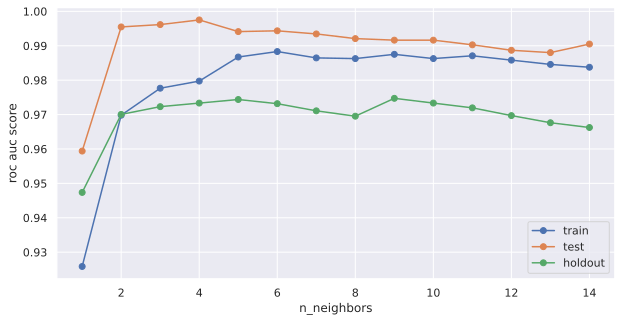

In [39]:
plt.figure(figsize = (10,5))
plt.plot(range(1, 15), train_roc_auc, 'o-', label='train')
plt.plot(range(1, 15), test_roc_auc, 'o-', label='test')
plt.plot(range(1, 15), holdout_roc_auc, 'o-', label='holdout')
plt.xlabel('n_neighbors')
plt.ylabel('roc auc score')
plt.legend(loc="lower right")
plt.show()

### **LogisticRegression**

In [40]:
from sklearn.linear_model import LogisticRegression

params = [
          {'penalty': ['l1', 'l2', 'elasticnet', 'none'],
           'dual': [True, False],
           'tol': [1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1],
           'C': np.array([0.0001, 0.001, 0.01, 0.1, 1, 10]),
           'fit_intercept': [True, False],
           'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
           'random_state': [17],
           'multi_class': ['auto', 'ovr', 'multinomial']}
]

logreg_cv = GridSearchCV(LogisticRegression(), params, cv=skf, 
                           scoring='roc_auc', verbose=True, n_jobs=-1)
logreg_cv.fit(X_train, y_train)

Fitting 5 folds for each of 8640 candidates, totalling 43200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 1660 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 11260 tasks      | elapsed:   27.8s
[Parallel(n_jobs=-1)]: Done 27260 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 43197 out of 43200 | elapsed:  2.4min remaining:    0.0s
[Parallel(n_jobs=-1)]: Done 43200 out of 43200 | elapsed:  2.4min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=5, shuffle=True),
             error_score=nan,
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='auto',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='lbfgs',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='deprecated'...
             param_grid=[{'C': array([1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01]),
                          'dual': [True, False], 'fit_intercept': [True, False],
                          'multi_class': ['auto', 'ovr', 'multinomial'],
                          'penalty': ['l1', 'l2', 'e

In [41]:
logreg_cv.best_params_

{'C': 1.0,
 'dual': False,
 'fit_intercept': True,
 'multi_class': 'auto',
 'penalty': 'l1',
 'random_state': 17,
 'solver': 'saga',
 'tol': 1e-06}

In [42]:
logreg_cv.best_score_

0.9979220085470086

In [43]:
y_pred = logreg_cv.best_estimator_.predict_proba(X_test)
roc_auc_score(y_test, y_pred[:, 1])

0.9975113122171946

In [44]:
holdout_pred = logreg_cv.best_estimator_.predict_proba(X_holdout)
roc_auc_score(y_holdout, holdout_pred[:, 1])

0.9854570637119113

In [45]:
logreg_best_params = logreg_cv.best_params_.copy()
del logreg_best_params['C']

In [46]:
train_roc_auc, test_roc_auc, holdout_roc_auc = [], [], []
for c in np.array([0.0001, 0.001, 0.01, 0.1, 1, 10]):
  lg = LogisticRegression(**logreg_best_params, C=c)
  train_roc_auc.append(mean(cross_val_score(lg, X_train, y_train, cv=skf,
                                            scoring='roc_auc')))
  
  lg.fit(X_train, y_train)
  y_pred = lg.predict_proba(X_test)
  test_score = roc_auc_score(y_test, y_pred[:, 1])
  test_roc_auc.append(test_score)

  holdout_pred = lg.predict_proba(X_holdout)
  holdout_score = roc_auc_score(y_holdout, holdout_pred[:, 1])
  holdout_roc_auc.append(holdout_score)

In [47]:
print(train_roc_auc)
print(test_roc_auc)
print(holdout_roc_auc)

[0.5, 0.5, 0.5, 0.9924786324786325, 0.9979220085470086, 0.9977136752136753]
[0.5, 0.5, 0.9604072398190047, 0.9957013574660634, 0.9975113122171946, 0.9975113122171946]
[0.5, 0.5, 0.9653739612188366, 0.9761080332409972, 0.9854570637119113, 0.9854570637119113]


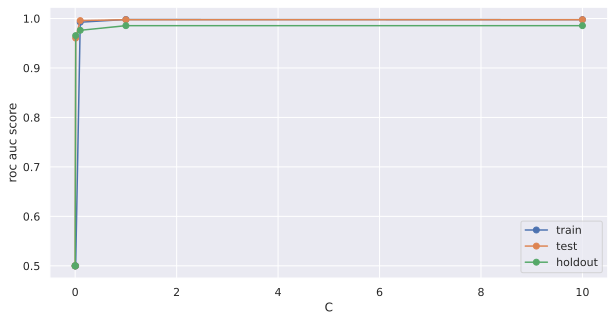

In [48]:
plt.figure(figsize = (10,5))
plt.plot(np.array([0.0001, 0.001, 0.01, 0.1, 1, 10]), train_roc_auc, 'o-', label='train')
plt.plot(np.array([0.0001, 0.001, 0.01, 0.1, 1, 10]), test_roc_auc, 'o-', label='test')
plt.plot(np.array([0.0001, 0.001, 0.01, 0.1, 1, 10]), holdout_roc_auc, 'o-', label='holdout')
plt.xlabel('C')
plt.ylabel('roc auc score')
plt.legend(loc="lower right")
plt.show()

### **RandomForest**

In [49]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(random_state= 17, n_jobs=-1)

In [50]:
parameters = {'n_estimators':  range(50,1000,50),
              'criterion': ['gini', 'entropy'],
              'max_depth': range(1,7),
              'min_samples_split': range(1,15),
              'min_samples_leaf': range(1,15)
}
rf_cv = RandomizedSearchCV(rf, parameters, cv=skf, scoring='roc_auc',
                           verbose=True, n_jobs=-1, n_iter=250)
rf_cv.fit(X_train, y_train)

Fitting 5 folds for each of 250 candidates, totalling 1250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   31.6s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 796 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 1246 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 1250 out of 1250 | elapsed: 14.2min finished


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=5, shuffle=True),
                   error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=...
                     

In [51]:
rf_cv.best_params_

{'criterion': 'entropy',
 'max_depth': 5,
 'min_samples_leaf': 2,
 'min_samples_split': 5,
 'n_estimators': 50}

In [52]:
rf_cv.best_score_

0.9912339743589744

In [53]:
y_pred = rf_cv.best_estimator_.predict_proba(X_test)
roc_auc_score(y_test, y_pred[:, 1])

0.9898190045248868

In [54]:
holdout_pred =rf_cv.predict_proba(X_holdout)
roc_auc_score(y_holdout, holdout_pred[:, 1])

0.9657202216066483

In [55]:
rf_best_params = rf_cv.best_params_.copy()
del rf_best_params['max_depth']

In [56]:
train_roc_auc, test_roc_auc, holdout_roc_auc = [], [], []
for depth in range(1,7):
  rf = RandomForestClassifier(**rf_best_params, max_depth=depth,
                              random_state= 17, n_jobs=-1)
  train_roc_auc.append(mean(cross_val_score(rf, X_train, y_train, cv=skf,
                                            scoring='roc_auc')))
  
  rf.fit(X_train, y_train)
  y_pred = rf.predict_proba(X_test)
  test_score = roc_auc_score(y_test, y_pred[:, 1])
  test_roc_auc.append(test_score)

  holdout_pred = rf.predict_proba(X_holdout)
  holdout_score = roc_auc_score(y_holdout, holdout_pred[:, 1])
  holdout_roc_auc.append(holdout_score)

In [57]:
print(train_roc_auc)
print(test_roc_auc)
print(holdout_roc_auc)

[0.9637371794871795, 0.974173076923077, 0.9839722222222222, 0.9897959401709402, 0.9912339743589744, 0.9908108974358975]
[0.9718325791855202, 0.9800904977375565, 0.9855203619909503, 0.992760180995475, 0.9898190045248868, 0.9880090497737557]
[0.9605263157894737, 0.9629501385041552, 0.9674515235457064, 0.9674515235457064, 0.9657202216066483, 0.9671052631578948]


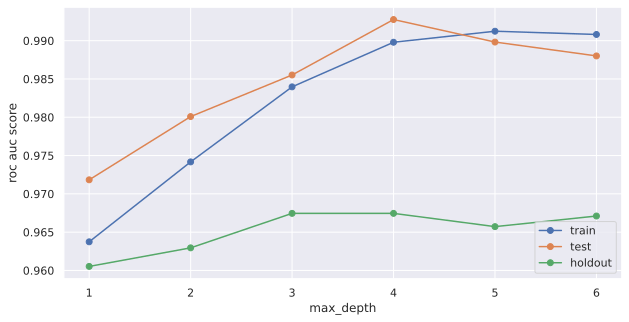

In [58]:
plt.figure(figsize = (10,5))
plt.plot(range(1,7), train_roc_auc, 'o-', label='train')
plt.plot(range(1,7), test_roc_auc, 'o-', label='test')
plt.plot(range(1,7), holdout_roc_auc, 'o-', label='holdout')
plt.xlabel('max_depth')
plt.ylabel('roc auc score')
plt.legend(loc="lower right")
plt.show()

### **Catboost**

In [59]:
!pip install -q catboost

     |████████████████████████████████| 69.2MB 57kB/s 


In [60]:
import catboost
from catboost import CatBoostClassifier

In [61]:
cbc = CatBoostClassifier(random_seed=17, eval_metric='AUC')

parameters = {'iterations': [100, 250, 500, 1000],
              'depth': [1, 2, 3, 4, 5, 6],
              'l2_leaf_reg': [0.2, 0.5, 1, 3],
              'learning_rate': [0.001, 0.1, 1, 10],
              'loss_function': ['Logloss', 'CrossEntropy']
}

cbc_cv = GridSearchCV(cbc, parameters, cv=skf, scoring='roc_auc', verbose=True,
                     n_jobs=-1)
cbc_cv.fit(X_train, y_train)

Fitting 5 folds for each of 768 candidates, totalling 3840 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 430 tasks      | elapsed:   41.7s
[Parallel(n_jobs=-1)]: Done 690 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 1148 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 1672 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 2222 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 2872 tasks      | elapsed: 17.6min
[Parallel(n_jobs=-1)]: Done 3622 tasks      | elapsed: 31.0min
[Parallel(n_jobs=-1)]: Done 3840 out of 3840 | elapsed: 40.2min finished


0:	total: 49.1ms	remaining: 24.5s
1:	total: 50.8ms	remaining: 12.6s
2:	total: 52ms	remaining: 8.61s
3:	total: 53.2ms	remaining: 6.6s
4:	total: 54.4ms	remaining: 5.39s
5:	total: 55.7ms	remaining: 4.58s
6:	total: 56.9ms	remaining: 4.01s
7:	total: 58.1ms	remaining: 3.57s
8:	total: 59.3ms	remaining: 3.24s
9:	total: 60.5ms	remaining: 2.97s
10:	total: 61.8ms	remaining: 2.75s
11:	total: 63ms	remaining: 2.56s
12:	total: 64.2ms	remaining: 2.4s
13:	total: 65.4ms	remaining: 2.27s
14:	total: 66.6ms	remaining: 2.15s
15:	total: 67.8ms	remaining: 2.05s
16:	total: 69ms	remaining: 1.96s
17:	total: 70.2ms	remaining: 1.88s
18:	total: 71.4ms	remaining: 1.81s
19:	total: 72.6ms	remaining: 1.74s
20:	total: 73.9ms	remaining: 1.68s
21:	total: 75.1ms	remaining: 1.63s
22:	total: 76.3ms	remaining: 1.58s
23:	total: 77.5ms	remaining: 1.54s
24:	total: 78.7ms	remaining: 1.49s
25:	total: 79.9ms	remaining: 1.46s
26:	total: 81ms	remaining: 1.42s
27:	total: 82.2ms	remaining: 1.39s
28:	total: 83.4ms	remaining: 1.35s
29:	t

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=5, shuffle=True),
             error_score=nan,
             estimator=<catboost.core.CatBoostClassifier object at 0x7f8086adfbd0>,
             iid='deprecated', n_jobs=-1,
             param_grid={'depth': [1, 2, 3, 4, 5, 6],
                         'iterations': [100, 250, 500, 1000],
                         'l2_leaf_reg': [0.2, 0.5, 1, 3],
                         'learning_rate': [0.001, 0.1, 1, 10],
                         'loss_function': ['Logloss', 'CrossEntropy']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='roc_auc', verbose=True)

In [62]:
cbc_cv.best_score_

0.9966463675213675

In [63]:
cbc_cv.best_params_

{'depth': 2,
 'iterations': 500,
 'l2_leaf_reg': 0.2,
 'learning_rate': 0.1,
 'loss_function': 'Logloss'}

In [64]:
y_pred = cbc_cv.best_estimator_.predict_proba(X_test)
roc_auc_score(y_test, y_pred[:, 1])

0.9941176470588236

In [65]:
holdout_pred =cbc_cv.predict_proba(X_holdout)
roc_auc_score(y_holdout, holdout_pred[:, 1])

0.9806094182825484

In [66]:
cbc_best_params = cbc_cv.best_params_.copy()
del cbc_best_params['depth']

In [67]:
train_roc_auc, test_roc_auc, holdout_roc_auc = [], [], []
for d in [1, 2, 3, 4, 5, 6]:
  cbc = CatBoostClassifier(**cbc_best_params, random_seed=17, eval_metric='AUC', depth=d)
  train_roc_auc.append(mean(cross_val_score(cbc, X_train, y_train, cv=skf,
                                            scoring='roc_auc')))
  
  cbc.fit(X_train, y_train)
  y_pred = cbc.predict_proba(X_test)
  test_score = roc_auc_score(y_test, y_pred[:, 1])
  test_roc_auc.append(test_score)

  holdout_pred = cbc.predict_proba(X_holdout)
  holdout_score = roc_auc_score(y_holdout, holdout_pred[:, 1])
  holdout_roc_auc.append(holdout_score)

Выходные данные были обрезаны до нескольких последних строк (5000).
0:	total: 3.27ms	remaining: 1.63s
1:	total: 6.57ms	remaining: 1.64s
2:	total: 9.81ms	remaining: 1.63s
3:	total: 13.1ms	remaining: 1.62s
4:	total: 16.3ms	remaining: 1.61s
5:	total: 19.6ms	remaining: 1.61s
6:	total: 22.8ms	remaining: 1.6s
7:	total: 25.9ms	remaining: 1.59s
8:	total: 37ms	remaining: 2.02s
9:	total: 40.5ms	remaining: 1.99s
10:	total: 43.8ms	remaining: 1.95s
11:	total: 47ms	remaining: 1.91s
12:	total: 50.3ms	remaining: 1.88s
13:	total: 53.6ms	remaining: 1.86s
14:	total: 56.9ms	remaining: 1.84s
15:	total: 60ms	remaining: 1.82s
16:	total: 63.2ms	remaining: 1.8s
17:	total: 66.4ms	remaining: 1.78s
18:	total: 69.6ms	remaining: 1.76s
19:	total: 72.8ms	remaining: 1.75s
20:	total: 76ms	remaining: 1.73s
21:	total: 79.1ms	remaining: 1.72s
22:	total: 82.3ms	remaining: 1.71s
23:	total: 85.5ms	remaining: 1.7s
24:	total: 88.8ms	remaining: 1.69s
25:	total: 91.9ms	remaining: 1.68s
26:	total: 95.1ms	remaining: 1.67s
27:	tota

In [68]:
print(train_roc_auc)
print(test_roc_auc)
print(holdout_roc_auc)

[0.9960064102564103, 0.9966463675213675, 0.9949764957264957, 0.9943525641025641, 0.9937168803418803, 0.9958023504273503]
[0.9855203619909503, 0.9941176470588236, 0.9923076923076923, 0.993891402714932, 0.9927601809954751, 0.9934389140271493]
[0.9826869806094183, 0.9806094182825484, 0.9806094182825484, 0.9840720221606647, 0.9813019390581719, 0.9802631578947367]


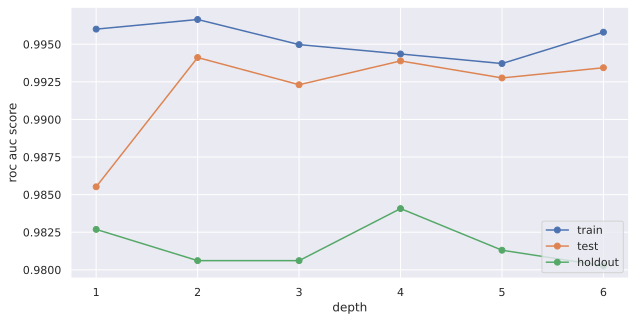

In [69]:
plt.figure(figsize = (10,5))
plt.plot([1, 2, 3, 4, 5, 6], train_roc_auc, 'o-', label='train')
plt.plot([1, 2, 3, 4, 5, 6], test_roc_auc, 'o-', label='test')
plt.plot([1, 2, 3, 4, 5, 6], holdout_roc_auc, 'o-', label='holdout')
plt.xlabel('depth')
plt.ylabel('roc auc score')
plt.legend(loc="lower right")
plt.show()

###  Часть 3. Выбор наилучшей модели

In [70]:
from sklearn.metrics import accuracy_score
import time

start_time = time.time()
y_pred_knn = knn_cv.best_estimator_.predict_proba(X_test)
#roc_auc_score(y_test, y_pred_knn[:, 1])
holdout_pred_knn = knn_cv.best_estimator_.predict_proba(X_holdout)
#roc_auc_score(y_holdout, holdout_pred_knn[:, 1])
knn_time = time.time() - start_time

start_time = time.time()
y_pred_logreg = logreg_cv.best_estimator_.predict_proba(X_test)
#roc_auc_score(y_test, y_pred_logreg[:, 1])
holdout_pred_logreg = logreg_cv.best_estimator_.predict_proba(X_holdout)
#roc_auc_score(y_holdout, holdout_pred_logreg[:, 1])
logreg_time = time.time() - start_time

start_time = time.time()
y_pred_rf = rf_cv.best_estimator_.predict_proba(X_test)
#roc_auc_score(y_test, y_pred_rf[:, 1])
holdout_pred_rf = rf_cv.best_estimator_.predict_proba(X_holdout)
#roc_auc_score(y_holdout, holdout_pred_rf[:, 1])
rf_time = time.time() - start_time

start_time = time.time()
y_pred_cbc = cbc_cv.best_estimator_.predict_proba(X_test)
#roc_auc_score(y_test, y_pred_cbc[:, 1])
holdout_pred_cbc = cbc_cv.best_estimator_.predict_proba(X_holdout)
#roc_auc_score(y_holdout, holdout_pred_cbc[:, 1])
cbc_time = time.time() - start_time

Для начала сравним roc auc score на тестовой части

In [71]:
models = pd.DataFrame({
    'Model': ['KNN','Logistic Regression','Random Forest', 'CatBoostClassifier'],
    'ROC AUC': [roc_auc_score(y_test, y_pred_knn[:, 1]),
                      roc_auc_score(y_test, y_pred_logreg[:, 1]),
                      roc_auc_score(y_test, y_pred_rf[:, 1]),
                      roc_auc_score(y_test, y_pred_cbc[:, 1])]})

models.sort_values(by='ROC AUC', ascending=False)

,Model,ROC AUC
1,Logistic Regression,0.997511
0,KNN,0.994344
3,CatBoostClassifier,0.994118
2,Random Forest,0.989819


Логистическая регрессия показывает наилучший результат

Теперь сравним тоже самое для holdout

In [72]:
models = pd.DataFrame({
    'Model': ['KNN','Logistic Regression','Random Forest', 'CatBoostClassifier'],
    'ROC AUC': [roc_auc_score(y_holdout, holdout_pred_knn[:, 1]),
                      roc_auc_score(y_holdout, holdout_pred_logreg[:, 1]),
                      roc_auc_score(y_holdout, holdout_pred_rf[:, 1]),
                      roc_auc_score(y_holdout, holdout_pred_cbc[:, 1])]})

models.sort_values(by='ROC AUC', ascending=False)

,Model,ROC AUC
1,Logistic Regression,0.985457
3,CatBoostClassifier,0.980609
0,KNN,0.973165
2,Random Forest,0.965720


Логистическая регрессия показывает наилучший результат

На данном этапе сравним точности моделей на X_test

In [73]:
models = pd.DataFrame({
    'Model': ['KNN','Logistic Regression','Random Forest', 'CatBoostClassifier'],
    'Accuracy': [accuracy_score(y_test, knn_cv.predict(X_test)),
                 accuracy_score(y_test, logreg_cv.predict(X_test)),
                 accuracy_score(y_test, rf_cv.predict(X_test)),
                 accuracy_score(y_test, cbc_cv.predict(X_test))]})

models.sort_values(by='Accuracy', ascending=False)

,Model,Accuracy
0,KNN,0.978102
1,Logistic Regression,0.978102
3,CatBoostClassifier,0.970803
2,Random Forest,0.948905


Наиболее точной оказались KNN и логистическая регрессия

Подобное сравнение и для holdout

In [74]:
models = pd.DataFrame({
    'Model': ['KNN','Logistic Regression','Random Forest', 'CatBoostClassifier'],
    'Accuracy': [accuracy_score(y_holdout, knn_cv.predict(X_holdout)),
                 accuracy_score(y_holdout, logreg_cv.predict(X_holdout)),
                 accuracy_score(y_holdout, rf_cv.predict(X_holdout)),
                 accuracy_score(y_holdout, cbc_cv.predict(X_holdout))]})

models.sort_values(by='Accuracy', ascending=False)

,Model,Accuracy
1,Logistic Regression,0.982456
0,KNN,0.956140
2,Random Forest,0.956140
3,CatBoostClassifier,0.938596


Тут лучшей модель - Логистическая регрессия

Далее проведем сравнение времени, которое уходит на предсказание test и holdout

In [75]:
models = pd.DataFrame({
    'Model': ['K - Nearest Neighbors','Logistic Regression','Random Forest', 'Gradient Boosting'],
    'Time': [knn_time, logreg_time, rf_time, cbc_time]})

models.sort_values(by='Time', ascending=True)

,Model,Time
1,Logistic Regression,0.001879
3,Gradient Boosting,0.002440
0,K - Nearest Neighbors,0.029044
2,Random Forest,0.205226


По веремени предсказания самой быстрой оказалась Логистическая регрессия

**Вывод**

В совокупности всех приведенных сравнений, наилучшая модель в рамках данной задачи - Logistic Regression